# Support Vector Machines

Support vector machines (SVM) are supervised learning models with associated learning algorithms that analyze data and recognize patterns. SVMs are used for classification and regression analysis.

Given a set of training examples, each marked for one of two categories (binary classification), an SVM training algorithm builds a model that assigns new examples into one category or the other, making it a non-probabilistic binary linear classifier.

An SVM model is a representation of the examples as points in space, mapped so that the examples of the separate categories are divided by a clear gap that is as wide as possible. New examples are then mapped onto that same space and predicted to belong on a category based on which side of the gap they are in. 

Basic intuition behind SVM:
* 2 groups of data mapped onto n-D space.
* Draw a separating hyperplane between the classes. 
* But there are infinitely many hyperplanes we can draw.
* We choose the hyperplane that maximizes the margin between the classes.
* The vector points that the margin lines touch are known as "support vectors".

We can expand SVM models beyond linearnly-separable data by using a "kernel trick": We add a third dimension that allows us to separate the data with a linear hyperplane. 

## Get data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
%matplotlib inline

In [2]:
from sklearn.datasets import load_breast_cancer

In [3]:
cancer = load_breast_cancer()

In [4]:
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [8]:
print(cancer.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [9]:
df = pd.DataFrame(cancer['data'],columns=cancer['feature_names'])
df.info() # 30 features, all numeric, 569 cases

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [10]:
df.head() # will need to be scaled

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [11]:
df.describe() # no missing data

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


## Some EDA

<AxesSubplot:>

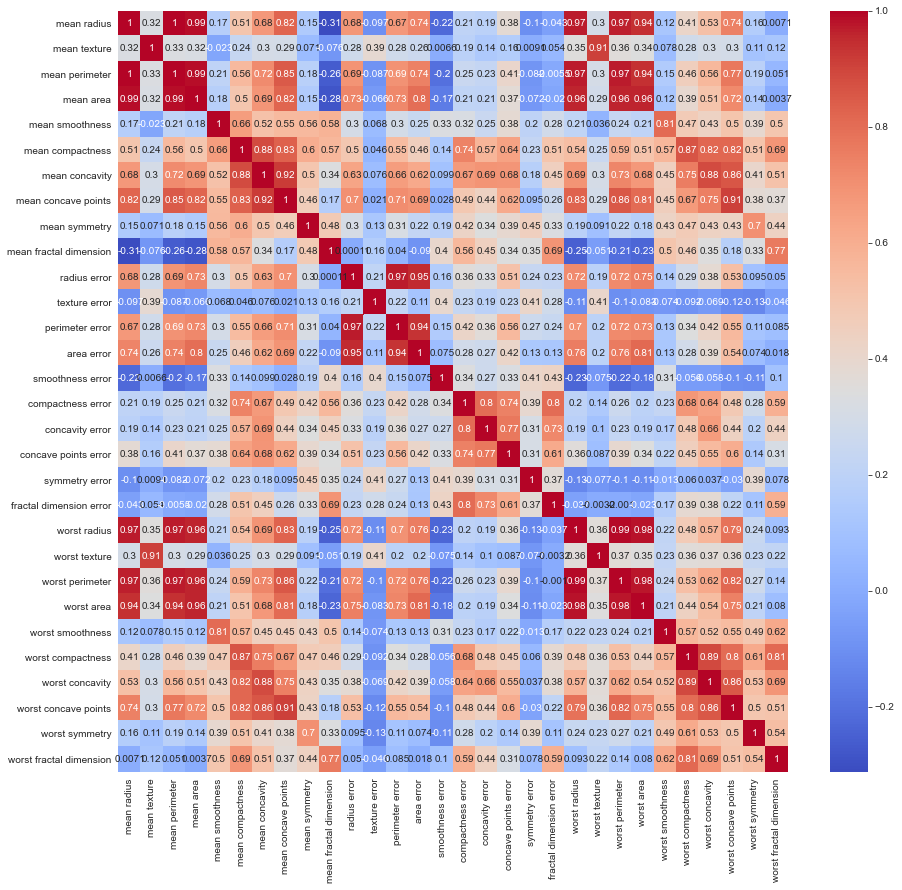

In [16]:
plt.figure(figsize=(15,14))
sns.heatmap(df.corr(), annot=True,cmap='coolwarm')

<Figure size 1800x1728 with 0 Axes>

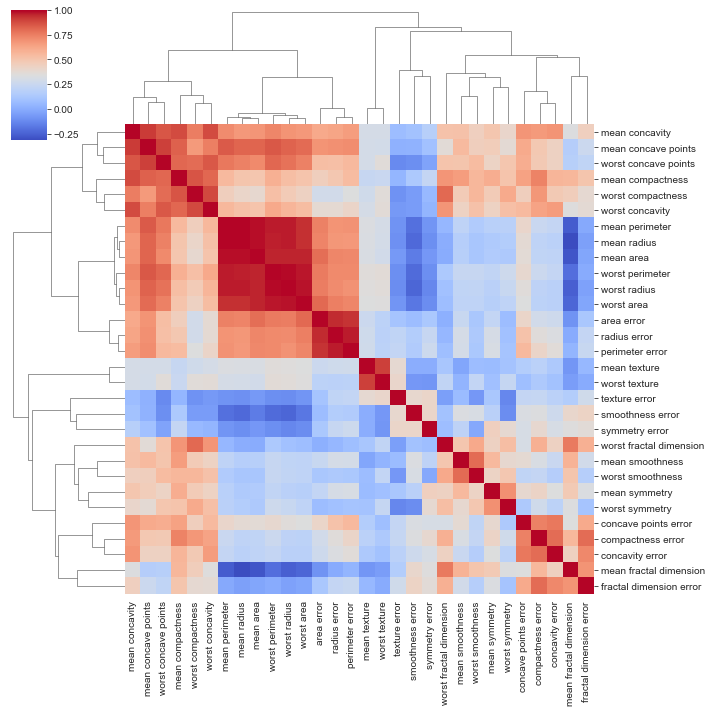

In [18]:
plt.figure(figsize=(15,14))
sns.clustermap(df.corr(),cmap='coolwarm')
# Similar Patterns: 
# 1. Concavity and compactness 
# 2. Area, radius, and perimeter
# 3. Texture, Smoothness and Symmetry 

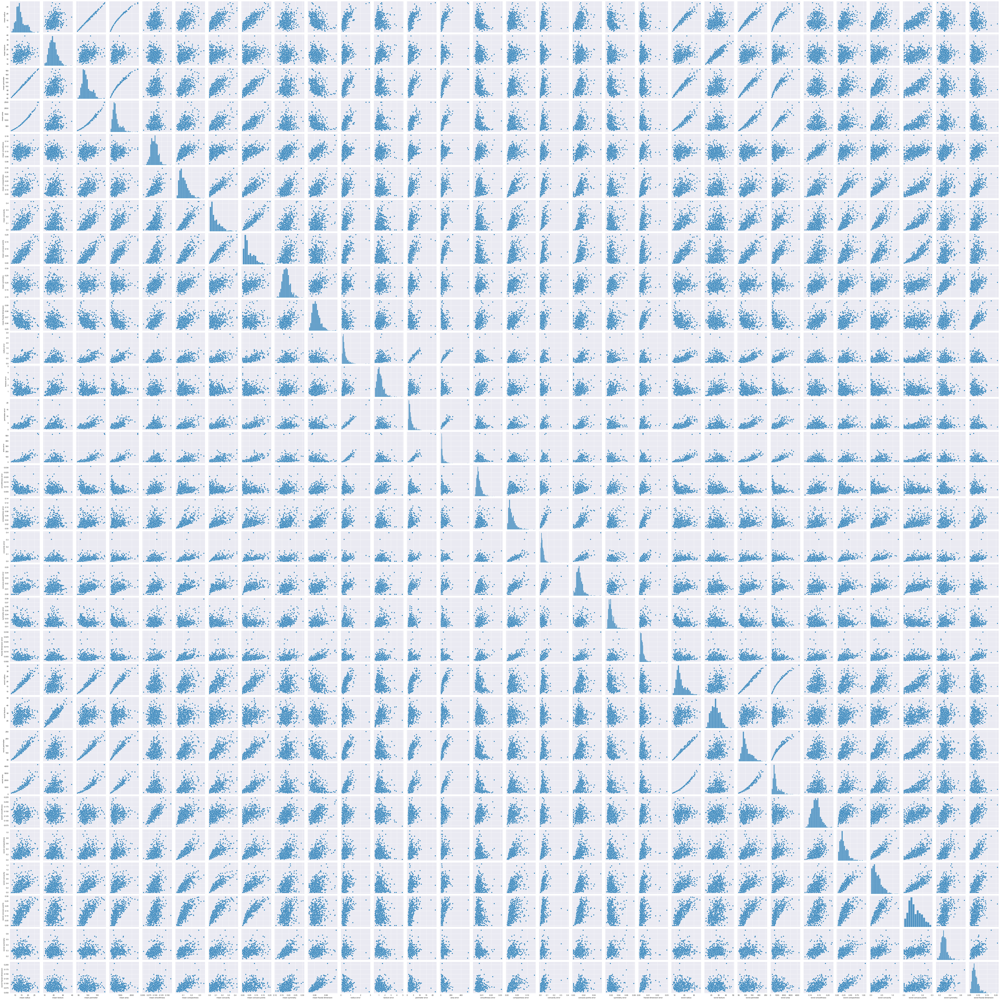

In [19]:
sns.pairplot(df)

## Data Prep

### Standardize Data

In [40]:
from sklearn.preprocessing import StandardScaler

In [41]:
scaler = StandardScaler()

In [43]:
scaled = scaler.fit_transform(df)

In [45]:
df = pd.DataFrame(scaled, columns=df.columns)
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


In [46]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,-3.153111e-15,-6.568462e-15,-6.993039e-16,-8.553985e-16,6.081447e-15,-1.136369e-15,-2.997017e-16,1.023981e-15,-1.860648e-15,-1.504752e-15,...,-2.297713e-15,1.742016e-15,-1.198807e-15,6.118909e-16,-5.094929e-15,-2.122887e-15,6.118909e-16,-1.998011e-16,-2.422589e-15,2.497514e-15
std,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,...,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00
min,-2.029648e+00,-2.229249e+00,-1.984504e+00,-1.454443e+00,-3.112085e+00,-1.610136e+00,-1.114873e+00,-1.261820e+00,-2.744117e+00,-1.819865e+00,...,-1.726901e+00,-2.223994e+00,-1.693361e+00,-1.222423e+00,-2.682695e+00,-1.443878e+00,-1.305831e+00,-1.745063e+00,-2.160960e+00,-1.601839e+00
25%,-6.893853e-01,-7.259631e-01,-6.919555e-01,-6.671955e-01,-7.109628e-01,-7.470860e-01,-7.437479e-01,-7.379438e-01,-7.032397e-01,-7.226392e-01,...,-6.749213e-01,-7.486293e-01,-6.895783e-01,-6.421359e-01,-6.912304e-01,-6.810833e-01,-7.565142e-01,-7.563999e-01,-6.418637e-01,-6.919118e-01
50%,-2.150816e-01,-1.046362e-01,-2.359800e-01,-2.951869e-01,-3.489108e-02,-2.219405e-01,-3.422399e-01,-3.977212e-01,-7.162650e-02,-1.782793e-01,...,-2.690395e-01,-4.351564e-02,-2.859802e-01,-3.411812e-01,-4.684277e-02,-2.695009e-01,-2.182321e-01,-2.234689e-01,-1.274095e-01,-2.164441e-01
75%,4.693926e-01,5.841756e-01,4.996769e-01,3.635073e-01,6.361990e-01,4.938569e-01,5.260619e-01,6.469351e-01,5.307792e-01,4.709834e-01,...,5.220158e-01,6.583411e-01,5.402790e-01,3.575891e-01,5.975448e-01,5.396688e-01,5.311411e-01,7.125100e-01,4.501382e-01,4.507624e-01
max,3.971288e+00,4.651889e+00,3.976130e+00,5.250529e+00,4.770911e+00,4.568425e+00,4.243589e+00,3.927930e+00,4.484751e+00,4.910919e+00,...,4.094189e+00,3.885905e+00,4.287337e+00,5.930172e+00,3.955374e+00,5.112877e+00,4.700669e+00,2.685877e+00,6.046041e+00,6.846856e+00


## Split data into train, validation, and test 

In [20]:
from sklearn.model_selection import train_test_split

In [85]:
# split into train+valid and test 
X_train_valid, X_test, y_train_valid, y_test = train_test_split(df, cancer['target'], test_size=0.25)

In [86]:
# split into train and valid
X_train, X_valid, y_train, y_valid = train_test_split(X_train_valid, y_train_valid, test_size=0.3)

## Modelling 

### Support Vector Machine

#### Build and train model

In [23]:
from sklearn.svm import SVC

In [24]:
svc = SVC()

In [25]:
svc.fit(X_train,y_train)

SVC()

#### Make predictions on validation data

In [26]:
svc_pred = svc.predict(X_valid)

#### Evaluate Model Performance

In [27]:
from sklearn.metrics import confusion_matrix, classification_report

<AxesSubplot:>

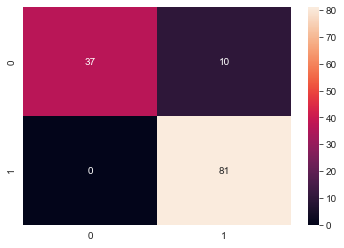

In [28]:
# 37 TN, 10 FP, 0 FN, 81 TP
sns.heatmap(confusion_matrix(y_valid,svc_pred),annot=True,fmt='g')

In [29]:
# 92% accuracy, 93% precision, 92% recall, 92% f1 score
print(classification_report(y_valid,svc_pred))

              precision    recall  f1-score   support

           0       1.00      0.79      0.88        47
           1       0.89      1.00      0.94        81

    accuracy                           0.92       128
   macro avg       0.95      0.89      0.91       128
weighted avg       0.93      0.92      0.92       128



#### Tune SVM hyperparameters with GridSearch

In [31]:
param_grid = {'C':[0.001,0.1,1,10,100,1000], 'gamma':[1,0.1,0.01,0.001,0.0001]}

In [30]:
from sklearn.model_selection import GridSearchCV

In [32]:
grid = GridSearchCV(SVC(),param_grid,verbose=3)

In [33]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV] C=0.001, gamma=1 ................................................
[CV] .................... C=0.001, gamma=1, score=0.617, total=   0.0s
[CV] C=0.001, gamma=1 ................................................
[CV] .................... C=0.001, gamma=1, score=0.617, total=   0.0s
[CV] C=0.001, gamma=1 ................................................
[CV] .................... C=0.001, gamma=1, score=0.617, total=   0.0s
[CV] C=0.001, gamma=1 ................................................
[CV] .................... C=0.001, gamma=1, score=0.627, total=   0.0s
[CV] C=0.001, gamma=1 ................................................
[CV] .................... C=0.001, gamma=1, score=0.610, total=   0.0s
[CV] C=0.001, gamma=0.1 ..............................................
[CV] .................. C=0.001, gamma=0.1, score=0.617, total=   0.0s
[CV] C=0.001, gamma=0.1 ..............................................
[CV] ..........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ...................... C=0.1, gamma=1, score=0.617, total=   0.0s
[CV] C=0.1, gamma=1 ..................................................
[CV] ...................... C=0.1, gamma=1, score=0.627, total=   0.0s
[CV] C=0.1, gamma=1 ..................................................
[CV] ...................... C=0.1, gamma=1, score=0.610, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] .................... C=0.1, gamma=0.1, score=0.617, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] .................... C=0.1, gamma=0.1, score=0.617, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] .................... C=0.1, gamma=0.1, score=0.617, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] .................... C=0.1, gamma=0.1, score=0.627, total=   0.0s
[CV] C=0.1, gamma=0.1 ................................................
[CV] .

[CV] .................... C=10, gamma=0.01, score=0.600, total=   0.0s
[CV] C=10, gamma=0.01 ................................................
[CV] .................... C=10, gamma=0.01, score=0.617, total=   0.0s
[CV] C=10, gamma=0.01 ................................................
[CV] .................... C=10, gamma=0.01, score=0.627, total=   0.0s
[CV] C=10, gamma=0.01 ................................................
[CV] .................... C=10, gamma=0.01, score=0.610, total=   0.0s
[CV] C=10, gamma=0.001 ...............................................
[CV] ................... C=10, gamma=0.001, score=0.900, total=   0.0s
[CV] C=10, gamma=0.001 ...............................................
[CV] ................... C=10, gamma=0.001, score=0.967, total=   0.0s
[CV] C=10, gamma=0.001 ...............................................
[CV] ................... C=10, gamma=0.001, score=0.867, total=   0.0s
[CV] C=10, gamma=0.001 ...............................................
[CV] .

[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    1.0s finished


GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.001, 0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
             verbose=3)

In [34]:
grid.best_estimator_

SVC(C=1, gamma=0.0001)

In [35]:
grid.best_score_

0.9226553672316384

In [37]:
grid_pred = grid.predict(X_valid)

<AxesSubplot:>

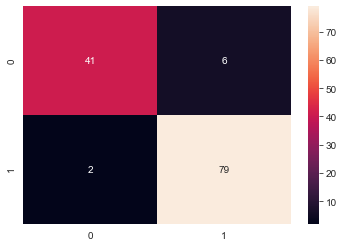

In [38]:
# 41 TN, 6 FP, 2 FN, 79 TP
sns.heatmap(confusion_matrix(y_valid,grid_pred),annot=True,fmt='g')

In [39]:
# 94% accuracy, 94% precision, 94% recall, 94% f1 score
print(classification_report(y_valid,grid_pred))

              precision    recall  f1-score   support

           0       0.95      0.87      0.91        47
           1       0.93      0.98      0.95        81

    accuracy                           0.94       128
   macro avg       0.94      0.92      0.93       128
weighted avg       0.94      0.94      0.94       128



#### Make predictions on validation data

### Logistic Regression 

#### Build and train model

In [48]:
from sklearn.linear_model import LogisticRegression

In [51]:
lrc = LogisticRegression(max_iter=2000)

In [52]:
lrc.fit(X_train,y_train)

LogisticRegression(max_iter=2000)

#### Make predictions on validation data

In [53]:
lrc_pred = lrc.predict(X_valid)

#### Evaluate Model Performance

<AxesSubplot:>

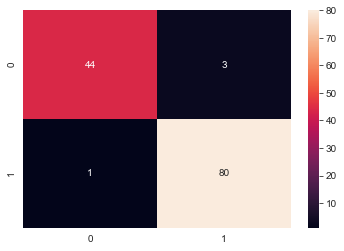

In [54]:
# 44 TN, 3 FP, 1 FN, 80 TP
sns.heatmap(confusion_matrix(y_valid,lrc_pred),annot=True,fmt='g')

In [55]:
# 97% accuracy, precision, recall, and f1 score
print(classification_report(y_valid,lrc_pred))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96        47
           1       0.96      0.99      0.98        81

    accuracy                           0.97       128
   macro avg       0.97      0.96      0.97       128
weighted avg       0.97      0.97      0.97       128



### Decision Tree

#### Build and train model

In [57]:
from sklearn.tree import DecisionTreeClassifier

In [58]:
dtc = DecisionTreeClassifier()

In [59]:
dtc.fit(X_train,y_train)

DecisionTreeClassifier()

#### Make predictions on validation data

In [60]:
dtc_pred = dtc.predict(X_valid)

#### Evaluate Model Performance

<AxesSubplot:>

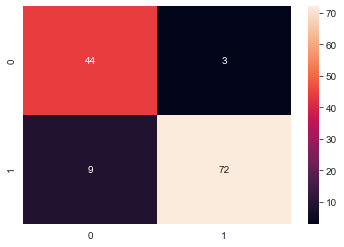

In [63]:
# 44 TN, 3 FP, 9 FN, 72 TP
sns.heatmap(confusion_matrix(y_valid,dtc_pred),annot=True,fmt='g')

In [64]:
# 91% accuracy, precision, recall, and f1 score
print(classification_report(y_valid,dtc_pred))

              precision    recall  f1-score   support

           0       0.83      0.94      0.88        47
           1       0.96      0.89      0.92        81

    accuracy                           0.91       128
   macro avg       0.90      0.91      0.90       128
weighted avg       0.91      0.91      0.91       128



### Random Forest 

#### Build and train model

In [65]:
from sklearn.ensemble import RandomForestClassifier

In [66]:
rfc = RandomForestClassifier(n_estimators=200)

In [67]:
rfc.fit(X_train,y_train)

RandomForestClassifier(n_estimators=200)

#### Make predictions on validation data

In [68]:
rfc_pred = rfc.predict(X_valid)

#### Evaluate Model Performance

<AxesSubplot:>

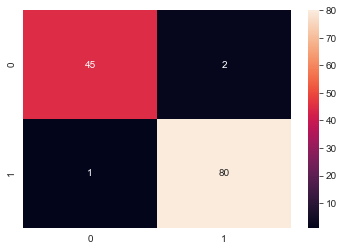

In [69]:
# 45 TN, 2 FP, 1 FN, 80 TP
sns.heatmap(confusion_matrix(y_valid,rfc_pred),annot=True,fmt='g')

In [70]:
# 98% accuracy, precision, recall, and f1 score
print(classification_report(y_valid,rfc_pred))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97        47
           1       0.98      0.99      0.98        81

    accuracy                           0.98       128
   macro avg       0.98      0.97      0.97       128
weighted avg       0.98      0.98      0.98       128



### K Nearest Neighbors

#### Build and train model 

In [71]:
from sklearn.neighbors import KNeighborsClassifier

In [72]:
knnc = KNeighborsClassifier()

In [73]:
knnc.fit(X_train,y_train)

KNeighborsClassifier()

#### Make predictions on validation data

In [75]:
knnc_pred = knnc.predict(X_valid)

#### Evaluate model performance

<AxesSubplot:>

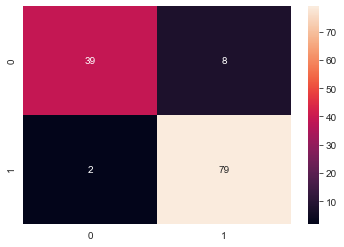

In [76]:
# 39 TN, 8 FP, 2 FN, 79 TP
sns.heatmap(confusion_matrix(y_valid,knnc_pred),annot=True,fmt='g')

In [78]:
# 92% accuracy, precision, recall, and f1 score
print(classification_report(y_valid,knnc_pred))

              precision    recall  f1-score   support

           0       0.95      0.83      0.89        47
           1       0.91      0.98      0.94        81

    accuracy                           0.92       128
   macro avg       0.93      0.90      0.91       128
weighted avg       0.92      0.92      0.92       128



#### Tune K with elbow method

In [79]:
error_rates = []

for k in range(1,100):
    knnc = KNeighborsClassifier(n_neighbors=k)
    knnc.fit(X_train,y_train)
    knnc_pred = knnc.predict(X_valid)
    err = np.mean(y_valid != knnc_pred)
    error_rates.append(err)

In [80]:
import plotly.express as px 
px.line(df, x=range(1,100), y=error_rates, title='Error Rate vs. K value', labels={'x':'K','y':'Error Rate'})

#### Build better model with k=12

In [81]:
knnc = KNeighborsClassifier(n_neighbors=12)
knnc.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=12)

#### Make predictions on validation data

In [82]:
knnc_pred = knnc.predict(X_valid)

#### Evaluate model performance

<AxesSubplot:>

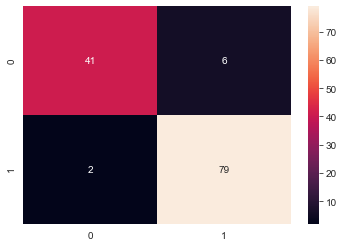

In [83]:
# 41 TN, 6 FP, 2 FN, 79 TP
sns.heatmap(confusion_matrix(y_valid,knnc_pred),annot=True,fmt='g')

In [84]:
# 94% accuracy, precision, recall, and f1 score
print(classification_report(y_valid,knnc_pred))

              precision    recall  f1-score   support

           0       0.95      0.87      0.91        47
           1       0.93      0.98      0.95        81

    accuracy                           0.94       128
   macro avg       0.94      0.92      0.93       128
weighted avg       0.94      0.94      0.94       128



### Neural Network

#### Build and train model

In [87]:
from sklearn.neural_network import MLPClassifier

In [88]:
mlpc = MLPClassifier(max_iter=2000)

In [89]:
mlpc.fit(X_train,y_train)

MLPClassifier(max_iter=2000)

#### Make predictions on validation data

In [90]:
mlpc_pred = mlpc.predict(X_valid)

#### Evaluate model performance

<AxesSubplot:>

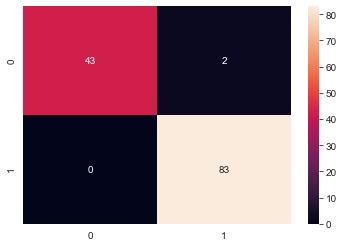

In [91]:
# 43 TN, 2 FP, 0 FN, 83 TP
sns.heatmap(confusion_matrix(y_valid,mlpc_pred),annot=True,fmt='g')

In [92]:
# 98% accuracy, precision, recall, f1 score 
print(classification_report(y_valid, mlpc_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        45
           1       0.98      1.00      0.99        83

    accuracy                           0.98       128
   macro avg       0.99      0.98      0.98       128
weighted avg       0.98      0.98      0.98       128



#### Check if hyperparameter tuning can squeeze better results

In [93]:
vals = [0.000001,0.00001,0.0001,0.001,0.01,0.1,0.5,1,2,5,10,100]
nn_p_grid = {'alpha':vals,'learning_rate_init':vals}

In [96]:
grid_nn = GridSearchCV(MLPClassifier(max_iter=2000),nn_p_grid,verbose=3)

In [98]:
grid_nn.fit(X_train,y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV] alpha=1e-06, learning_rate_init=1e-06 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-06, score=0.733, total=   0.0s
[CV] alpha=1e-06, learning_rate_init=1e-06 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-06, score=0.700, total=   0.0s
[CV] alpha=1e-06, learning_rate_init=1e-06 ...........................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  alpha=1e-06, learning_rate_init=1e-06, score=0.667, total=   0.8s
[CV] alpha=1e-06, learning_rate_init=1e-06 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-06, score=0.576, total=   2.0s
[CV] alpha=1e-06, learning_rate_init=1e-06 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-06, score=0.661, total=   0.0s
[CV] alpha=1e-06, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-05, score=0.883, total=   1.7s
[CV] alpha=1e-06, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-05, score=0.933, total=   1.8s
[CV] alpha=1e-06, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-05, score=0.983, total=   1.8s
[CV] alpha=1e-06, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-06, learning_rate_init=1e-05, score=0.949, total=   2.1s
[CV] alpha=1e-06, learning_rate_init=1e-05 ...........................

[CV]  alpha=1e-05, learning_rate_init=1e-06, score=0.583, total=   1.1s
[CV] alpha=1e-05, learning_rate_init=1e-06 ...........................
[CV]  alpha=1e-05, learning_rate_init=1e-06, score=0.600, total=   0.0s
[CV] alpha=1e-05, learning_rate_init=1e-06 ...........................
[CV]  alpha=1e-05, learning_rate_init=1e-06, score=0.407, total=   0.7s
[CV] alpha=1e-05, learning_rate_init=1e-06 ...........................
[CV]  alpha=1e-05, learning_rate_init=1e-06, score=0.441, total=   0.0s
[CV] alpha=1e-05, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-05, learning_rate_init=1e-05, score=0.883, total=   2.0s
[CV] alpha=1e-05, learning_rate_init=1e-05 ...........................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV]  alpha=1e-05, learning_rate_init=1e-05, score=0.933, total=   2.4s
[CV] alpha=1e-05, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-05, learning_rate_init=1e-05, score=0.967, total=   1.8s
[CV] alpha=1e-05, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-05, learning_rate_init=1e-05, score=0.915, total=   1.7s
[CV] alpha=1e-05, learning_rate_init=1e-05 ...........................
[CV]  alpha=1e-05, learning_rate_init=1e-05, score=0.932, total=   2.0s
[CV] alpha=1e-05, learning_rate_init=0.0001 ..........................
[CV]  alpha=1e-05, learning_rate_init=0.0001, score=0.933, total=   0.8s
[CV] alpha=1e-05, learning_rate_init=0.0001 ..........................
[CV]  alpha=1e-05, learning_rate_init=0.0001, score=0.950, total=   0.8s
[CV] alpha=1e-05, learning_rate_init=0.0001 ..........................
[CV]  alpha=1e-05, learning_rate_init=0.0001, score=0.983, total=   0.7s
[CV] alpha=1e-05, learning_rate_init=0.0001 .......................

[CV]  alpha=0.0001, learning_rate_init=1e-06, score=0.407, total=   2.3s
[CV] alpha=0.0001, learning_rate_init=1e-05 ..........................
[CV]  alpha=0.0001, learning_rate_init=1e-05, score=0.900, total=   1.7s
[CV] alpha=0.0001, learning_rate_init=1e-05 ..........................
[CV]  alpha=0.0001, learning_rate_init=1e-05, score=0.933, total=   1.7s
[CV] alpha=0.0001, learning_rate_init=1e-05 ..........................
[CV]  alpha=0.0001, learning_rate_init=1e-05, score=0.950, total=   1.9s
[CV] alpha=0.0001, learning_rate_init=1e-05 ..........................
[CV]  alpha=0.0001, learning_rate_init=1e-05, score=0.932, total=   1.8s
[CV] alpha=0.0001, learning_rate_init=1e-05 ..........................
[CV]  alpha=0.0001, learning_rate_init=1e-05, score=0.983, total=   2.1s
[CV] alpha=0.0001, learning_rate_init=0.0001 .........................
[CV]  alpha=0.0001, learning_rate_init=0.0001, score=0.933, total=   0.8s
[CV] alpha=0.0001, learning_rate_init=0.0001 .................

/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV]  alpha=0.001, learning_rate_init=1e-06, score=0.350, total=   2.4s
[CV] alpha=0.001, learning_rate_init=1e-06 ...........................
[CV]  alpha=0.001, learning_rate_init=1e-06, score=0.627, total=   0.1s
[CV] alpha=0.001, learning_rate_init=1e-06 ...........................
[CV]  alpha=0.001, learning_rate_init=1e-06, score=0.644, total=   0.0s
[CV] alpha=0.001, learning_rate_init=1e-05 ...........................
[CV]  alpha=0.001, learning_rate_init=1e-05, score=0.917, total=   2.0s
[CV] alpha=0.001, learning_rate_init=1e-05 ...........................
[CV]  alpha=0.001, learning_rate_init=1e-05, score=0.917, total=   2.2s
[CV] alpha=0.001, learning_rate_init=1e-05 ...........................
[CV]  alpha=0.001, learning_rate_init=1e-05, score=0.933, total=   1.8s
[CV] alpha=0.001, learning_rate_init=1e-05 ...........................
[CV]  alpha=0.001, learning_rate_init=1e-05, score=0.932, total=   1.8s
[CV] alpha=0.001, learning_rate_init=1e-05 ...........................

[CV]  alpha=0.01, learning_rate_init=1e-06, score=0.550, total=   0.7s
[CV] alpha=0.01, learning_rate_init=1e-06 ............................
[CV]  alpha=0.01, learning_rate_init=1e-06, score=0.467, total=   0.0s
[CV] alpha=0.01, learning_rate_init=1e-06 ............................
[CV]  alpha=0.01, learning_rate_init=1e-06, score=0.333, total=   2.0s
[CV] alpha=0.01, learning_rate_init=1e-06 ............................
[CV]  alpha=0.01, learning_rate_init=1e-06, score=0.305, total=   0.6s
[CV] alpha=0.01, learning_rate_init=1e-06 ............................
[CV]  alpha=0.01, learning_rate_init=1e-06, score=0.458, total=   0.7s
[CV] alpha=0.01, learning_rate_init=1e-05 ............................
[CV]  alpha=0.01, learning_rate_init=1e-05, score=0.917, total=   2.2s
[CV] alpha=0.01, learning_rate_init=1e-05 ............................
[CV]  alpha=0.01, learning_rate_init=1e-05, score=0.950, total=   1.8s
[CV] alpha=0.01, learning_rate_init=1e-05 ............................
[CV]  

[CV] . alpha=0.1, learning_rate_init=1e-06, score=0.267, total=   0.1s
[CV] alpha=0.1, learning_rate_init=1e-06 .............................
[CV] . alpha=0.1, learning_rate_init=1e-06, score=0.610, total=   1.8s
[CV] alpha=0.1, learning_rate_init=1e-06 .............................
[CV] . alpha=0.1, learning_rate_init=1e-06, score=0.729, total=   0.0s
[CV] alpha=0.1, learning_rate_init=1e-05 .............................
[CV] . alpha=0.1, learning_rate_init=1e-05, score=0.933, total=   1.7s
[CV] alpha=0.1, learning_rate_init=1e-05 .............................
[CV] . alpha=0.1, learning_rate_init=1e-05, score=0.933, total=   2.0s
[CV] alpha=0.1, learning_rate_init=1e-05 .............................
[CV] . alpha=0.1, learning_rate_init=1e-05, score=0.967, total=   2.1s
[CV] alpha=0.1, learning_rate_init=1e-05 .............................
[CV] . alpha=0.1, learning_rate_init=1e-05, score=0.915, total=   2.3s
[CV] alpha=0.1, learning_rate_init=1e-05 .............................
[CV] .

[CV] . alpha=0.5, learning_rate_init=1e-06, score=0.300, total=   1.0s
[CV] alpha=0.5, learning_rate_init=1e-06 .............................
[CV] . alpha=0.5, learning_rate_init=1e-06, score=0.610, total=   0.0s
[CV] alpha=0.5, learning_rate_init=1e-06 .............................
[CV] . alpha=0.5, learning_rate_init=1e-06, score=0.559, total=   0.8s
[CV] alpha=0.5, learning_rate_init=1e-05 .............................
[CV] . alpha=0.5, learning_rate_init=1e-05, score=0.917, total=   1.9s
[CV] alpha=0.5, learning_rate_init=1e-05 .............................
[CV] . alpha=0.5, learning_rate_init=1e-05, score=0.950, total=   1.7s
[CV] alpha=0.5, learning_rate_init=1e-05 .............................
[CV] . alpha=0.5, learning_rate_init=1e-05, score=1.000, total=   1.9s
[CV] alpha=0.5, learning_rate_init=1e-05 .............................
[CV] . alpha=0.5, learning_rate_init=1e-05, score=0.983, total=   2.2s
[CV] alpha=0.5, learning_rate_init=1e-05 .............................
[CV] .

[CV] ... alpha=1, learning_rate_init=1e-06, score=0.373, total=   0.0s
[CV] alpha=1, learning_rate_init=1e-06 ...............................
[CV] ... alpha=1, learning_rate_init=1e-06, score=0.610, total=   2.1s
[CV] alpha=1, learning_rate_init=1e-05 ...............................
[CV] ... alpha=1, learning_rate_init=1e-05, score=0.933, total=   1.8s
[CV] alpha=1, learning_rate_init=1e-05 ...............................
[CV] ... alpha=1, learning_rate_init=1e-05, score=0.933, total=   1.7s
[CV] alpha=1, learning_rate_init=1e-05 ...............................
[CV] ... alpha=1, learning_rate_init=1e-05, score=0.967, total=   1.9s
[CV] alpha=1, learning_rate_init=1e-05 ...............................
[CV] ... alpha=1, learning_rate_init=1e-05, score=0.915, total=   2.2s
[CV] alpha=1, learning_rate_init=1e-05 ...............................
[CV] ... alpha=1, learning_rate_init=1e-05, score=0.983, total=   1.8s
[CV] alpha=1, learning_rate_init=0.0001 ..............................
[CV] .

[CV] ... alpha=2, learning_rate_init=1e-06, score=0.288, total=   0.4s
[CV] alpha=2, learning_rate_init=1e-06 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=2, learning_rate_init=1e-06, score=0.373, total=   2.3s
[CV] alpha=2, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=2, learning_rate_init=1e-05, score=0.900, total=   2.4s
[CV] alpha=2, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=2, learning_rate_init=1e-05, score=0.933, total=   2.3s
[CV] alpha=2, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=2, learning_rate_init=1e-05, score=0.950, total=   2.4s
[CV] alpha=2, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=2, learning_rate_init=1e-05, score=0.898, total=   2.2s
[CV] alpha=2, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=2, learning_rate_init=1e-05, score=0.949, total=   2.3s
[CV] alpha=2, learning_rate_init=0.0001 ..............................
[CV] .. alpha=2, learning_rate_init=0.0001, score=0.950, total=   1.6s
[CV] alpha=2, learning_rate_init=0.0001 ..............................
[CV] .. alpha=2, learning_rate_init=0.0001, score=0.967, total=   1.5s
[CV] alpha=2, learning_rate_init=0.0001 ..............................
[CV] .. alpha=2, learning_rate_init=0.0001, score=1.000, total=   1.6s
[CV] alpha=2, learning_rate_init=0.0001 ..............................
[CV] .. alpha=2, learning_rate_init=0.0001, score=0.966, total=   1.5s
[CV] alpha=2, learning_rate_init=0.0001 ..............................
[CV] .. alpha=2, learning_rate_init=0.0001, score=0.966, total=   1.5s
[CV] alpha=2, learning_rate_init=0.001 ...............................
[CV] ... alpha=2, learning_rate_init=0.001, score=0.950, total=   0.4s
[CV] alpha=2, learning_rate_init=0.001 ...............................
[CV] .

/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=5, learning_rate_init=1e-05, score=0.900, total=   2.3s
[CV] alpha=5, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=5, learning_rate_init=1e-05, score=0.933, total=   2.4s
[CV] alpha=5, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=5, learning_rate_init=1e-05, score=0.950, total=   2.4s
[CV] alpha=5, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=5, learning_rate_init=1e-05, score=0.898, total=   2.4s
[CV] alpha=5, learning_rate_init=1e-05 ...............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] ... alpha=5, learning_rate_init=1e-05, score=0.915, total=   2.4s
[CV] alpha=5, learning_rate_init=0.0001 ..............................
[CV] .. alpha=5, learning_rate_init=0.0001, score=0.950, total=   1.7s
[CV] alpha=5, learning_rate_init=0.0001 ..............................
[CV] .. alpha=5, learning_rate_init=0.0001, score=0.967, total=   1.7s
[CV] alpha=5, learning_rate_init=0.0001 ..............................
[CV] .. alpha=5, learning_rate_init=0.0001, score=1.000, total=   1.6s
[CV] alpha=5, learning_rate_init=0.0001 ..............................
[CV] .. alpha=5, learning_rate_init=0.0001, score=0.983, total=   1.7s
[CV] alpha=5, learning_rate_init=0.0001 ..............................
[CV] .. alpha=5, learning_rate_init=0.0001, score=0.983, total=   1.6s
[CV] alpha=5, learning_rate_init=0.001 ...............................
[CV] ... alpha=5, learning_rate_init=0.001, score=0.950, total=   0.3s
[CV] alpha=5, learning_rate_init=0.001 ...............................
[CV] .

/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] .. alpha=10, learning_rate_init=1e-05, score=0.900, total=   2.2s
[CV] alpha=10, learning_rate_init=1e-05 ..............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] .. alpha=10, learning_rate_init=1e-05, score=0.950, total=   2.2s
[CV] alpha=10, learning_rate_init=1e-05 ..............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] .. alpha=10, learning_rate_init=1e-05, score=0.950, total=   2.2s
[CV] alpha=10, learning_rate_init=1e-05 ..............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] .. alpha=10, learning_rate_init=1e-05, score=0.932, total=   2.4s
[CV] alpha=10, learning_rate_init=1e-05 ..............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] .. alpha=10, learning_rate_init=1e-05, score=0.915, total=   2.2s
[CV] alpha=10, learning_rate_init=0.0001 .............................
[CV] . alpha=10, learning_rate_init=0.0001, score=0.933, total=   1.7s
[CV] alpha=10, learning_rate_init=0.0001 .............................
[CV] . alpha=10, learning_rate_init=0.0001, score=0.983, total=   1.7s
[CV] alpha=10, learning_rate_init=0.0001 .............................
[CV] . alpha=10, learning_rate_init=0.0001, score=0.950, total=   1.8s
[CV] alpha=10, learning_rate_init=0.0001 .............................
[CV] . alpha=10, learning_rate_init=0.0001, score=0.949, total=   1.7s
[CV] alpha=10, learning_rate_init=0.0001 .............................
[CV] . alpha=10, learning_rate_init=0.0001, score=0.983, total=   1.7s
[CV] alpha=10, learning_rate_init=0.001 ..............................
[CV] .. alpha=10, learning_rate_init=0.001, score=0.933, total=   0.3s
[CV] alpha=10, learning_rate_init=0.001 ..............................
[CV] .

/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-06, score=0.633, total=   2.2s
[CV] alpha=100, learning_rate_init=1e-06 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-06, score=0.550, total=   2.2s
[CV] alpha=100, learning_rate_init=1e-06 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-06, score=0.467, total=   2.2s
[CV] alpha=100, learning_rate_init=1e-06 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-06, score=0.746, total=   2.5s
[CV] alpha=100, learning_rate_init=1e-06 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-06, score=0.542, total=   2.4s
[CV] alpha=100, learning_rate_init=1e-05 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-05, score=0.900, total=   2.4s
[CV] alpha=100, learning_rate_init=1e-05 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-05, score=0.917, total=   2.3s
[CV] alpha=100, learning_rate_init=1e-05 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-05, score=0.750, total=   2.4s
[CV] alpha=100, learning_rate_init=1e-05 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-05, score=0.915, total=   2.3s
[CV] alpha=100, learning_rate_init=1e-05 .............................


/Users/kbgazzaz/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.



[CV] . alpha=100, learning_rate_init=1e-05, score=0.610, total=   2.2s
[CV] alpha=100, learning_rate_init=0.0001 ............................
[CV]  alpha=100, learning_rate_init=0.0001, score=0.600, total=   2.1s
[CV] alpha=100, learning_rate_init=0.0001 ............................
[CV]  alpha=100, learning_rate_init=0.0001, score=0.600, total=   2.1s
[CV] alpha=100, learning_rate_init=0.0001 ............................
[CV]  alpha=100, learning_rate_init=0.0001, score=0.617, total=   2.1s
[CV] alpha=100, learning_rate_init=0.0001 ............................
[CV]  alpha=100, learning_rate_init=0.0001, score=0.644, total=   2.3s
[CV] alpha=100, learning_rate_init=0.0001 ............................
[CV]  alpha=100, learning_rate_init=0.0001, score=0.610, total=   2.3s
[CV] alpha=100, learning_rate_init=0.001 .............................
[CV] . alpha=100, learning_rate_init=0.001, score=0.600, total=   0.3s
[CV] alpha=100, learning_rate_init=0.001 .............................
[CV] .

[Parallel(n_jobs=1)]: Done 720 out of 720 | elapsed:  4.7min finished


GridSearchCV(estimator=MLPClassifier(max_iter=2000),
             param_grid={'alpha': [1e-06, 1e-05, 0.0001, 0.001, 0.01, 0.1, 0.5,
                                   1, 2, 5, 10, 100],
                         'learning_rate_init': [1e-06, 1e-05, 0.0001, 0.001,
                                                0.01, 0.1, 0.5, 1, 2, 5, 10,
                                                100]},
             verbose=3)

In [99]:
grid_nn.best_estimator_

MLPClassifier(alpha=1e-05, learning_rate_init=0.01, max_iter=2000)

In [100]:
# about same score as before
grid_nn.best_score_

0.9799435028248589

In [101]:
grid_nn_pred = grid_nn.predict(X_valid)

<AxesSubplot:>

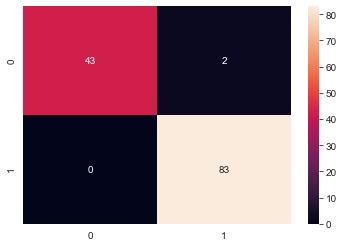

In [102]:
# 43 TN, 2 FP, 0 FN, 83 TP
sns.heatmap(confusion_matrix(y_valid,grid_nn_pred),annot=True,fmt='g')

In [103]:
# 98% accuracy, precision, recall, f1 score
print(classification_report(y_valid, grid_nn_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        45
           1       0.98      1.00      0.99        83

    accuracy                           0.98       128
   macro avg       0.99      0.98      0.98       128
weighted avg       0.98      0.98      0.98       128



## Deploy best model: Neural Network

In [107]:
predictions = grid_nn.predict(X_test)

<AxesSubplot:>

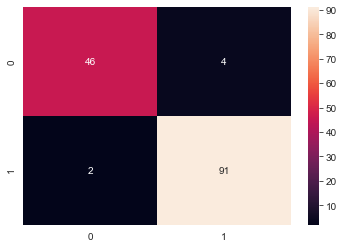

In [108]:
# 46 TN. 4 FP, 2 FN, 91 TP
sns.heatmap(confusion_matrix(y_test,predictions),annot=True,fmt='g')

In [109]:
# Deployed model: 96% accuracy, precision, recall, f1 score
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.96      0.92      0.94        50
           1       0.96      0.98      0.97        93

    accuracy                           0.96       143
   macro avg       0.96      0.95      0.95       143
weighted avg       0.96      0.96      0.96       143

